In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

In [2]:
data = pd.read_csv('진짜가중평균.csv',engine='python',encoding='utf-8-sig')
data1 = pd.read_csv('직전년도.csv',engine='python',encoding='utf-8-sig')
data2 = pd.read_csv('프로기록있는선수들통과11.csv') # 대회년도 평균내서 가져오기 위한 용도
key = pd.read_csv('afterdrop.csv',engine='python',encoding='utf-8-sig')

In [3]:
data2 = data2.reset_index(drop=True)

In [4]:
year = data2.groupby(['선수명','대학교']).mean()

In [5]:
data5 =pd.merge(data,year['대회년도'],how='left',on='선수명').dropna(axis=0).reset_index(drop=True)

In [6]:
data3 =pd.merge(data5,data1[['선수명','키','EFF']],how='left',on='선수명').dropna(axis=0).reset_index(drop=True)

In [7]:
data3 # 대회년도, 키, 4년 max eff추가

,Unnamed: 0,선수명,대학교,경기수,전체 출전시간,득점 전체,득점 평균,2점슛 성공,2점슛 시도,2점슛 성공률,...,굿디펜스,속공,FBF,턴오버,팀 리바운드,팀 턴오버,년수,대회년도,키,EFF
0,1,강병진,건국대학교,3.6,421.785000,10.3,2.2,3.2,8.2,4.030,...,1.6,0.0,0.0,4.0,0.0,0.0,3.0,2009.000000,193.0,81.0
1,3,강상재,고려대학교,18.9,4205.098333,233.0,22.9,90.9,162.4,10.807,...,9.3,8.9,2.6,28.4,0.8,0.0,4.0,2014.500000,200.0,807.0
2,4,강우형,경희대학교,6.0,1391.380000,32.5,4.0,11.0,13.6,7.320,...,5.4,0.0,0.0,7.5,0.0,0.0,3.0,2004.333333,191.0,44.0
3,6,강은식,한양대학교,4.6,896.576667,56.3,11.9,22.1,36.6,5.998,...,8.9,0.0,0.0,8.0,0.0,0.0,3.0,2002.666667,198.0,90.0
4,7,강준구,한양대학교,5.1,1094.250000,47.1,8.6,7.2,13.9,4.300,...,2.1,0.0,0.0,7.8,0.0,0.0,3.0,2000.000000,185.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,503,홍경기,고려대학교,4.0,1365.050000,51.0,12.0,8.0,14.0,5.710,...,1.0,0.0,0.0,10.0,0.0,0.0,1.0,2010.000000,184.0,362.0
354,504,홍석민,동국대학교,18.7,2765.428333,90.2,9.7,27.4,58.0,10.248,...,2.8,1.1,0.6,12.9,1.6,0.7,4.0,2015.333333,197.0,2.0
355,505,홍성헌,성균관대학교,4.1,1235.015000,59.3,14.3,22.8,54.2,4.430,...,7.2,0.0,0.0,6.3,0.0,0.0,3.0,2005.000000,195.0,-1.0
356,506,홍수화,한양대학교,4.3,1148.940000,55.5,12.5,15.0,26.6,5.464,...,3.5,0.0,0.0,12.8,0.0,0.0,4.0,2007.500000,194.5,333.0


In [8]:
data3 = data3.drop(['Unnamed: 0'], axis=1)

In [9]:
final = (data3.drop_duplicates(['선수명'])).reset_index(drop=True)

In [10]:
final #최종 데이터 프레임

,선수명,대학교,경기수,전체 출전시간,득점 전체,득점 평균,2점슛 성공,2점슛 시도,2점슛 성공률,3점슛 성공,...,굿디펜스,속공,FBF,턴오버,팀 리바운드,팀 턴오버,년수,대회년도,키,EFF
0,강병진,건국대학교,3.6,421.785000,10.3,2.2,3.2,8.2,4.030,1.2,...,1.6,0.0,0.0,4.0,0.0,0.0,3.0,2009.000000,193.0,81.0
1,강상재,고려대학교,18.9,4205.098333,233.0,22.9,90.9,162.4,10.807,10.4,...,9.3,8.9,2.6,28.4,0.8,0.0,4.0,2014.500000,200.0,807.0
2,강우형,경희대학교,6.0,1391.380000,32.5,4.0,11.0,13.6,7.320,2.5,...,5.4,0.0,0.0,7.5,0.0,0.0,3.0,2004.333333,191.0,44.0
3,강은식,한양대학교,4.6,896.576667,56.3,11.9,22.1,36.6,5.998,0.3,...,8.9,0.0,0.0,8.0,0.0,0.0,3.0,2002.666667,198.0,90.0
4,강준구,한양대학교,5.1,1094.250000,47.1,8.6,7.2,13.9,4.300,9.1,...,2.1,0.0,0.0,7.8,0.0,0.0,3.0,2000.000000,185.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326,홍경기,고려대학교,4.0,1365.050000,51.0,12.0,8.0,14.0,5.710,10.0,...,1.0,0.0,0.0,10.0,0.0,0.0,1.0,2010.000000,184.0,362.0
327,홍석민,동국대학교,18.7,2765.428333,90.2,9.7,27.4,58.0,10.248,11.1,...,2.8,1.1,0.6,12.9,1.6,0.7,4.0,2015.333333,197.0,2.0
328,홍성헌,성균관대학교,4.1,1235.015000,59.3,14.3,22.8,54.2,4.430,0.0,...,7.2,0.0,0.0,6.3,0.0,0.0,3.0,2005.000000,195.0,-1.0
329,홍수화,한양대학교,4.3,1148.940000,55.5,12.5,15.0,26.6,5.464,5.8,...,3.5,0.0,0.0,12.8,0.0,0.0,4.0,2007.500000,194.5,333.0


In [11]:
labels_total = ['-100','101-200','201-300','301-400','401-500','501-600','601-700','more than 700']
ratio_total = [0]*len(labels_total)
for i in range(len(final['EFF'])):
    if final['EFF'][i] <=100:
        ratio_total[0]+=1
    elif final['EFF'][i] <=200 and final['EFF'][i] >=101:
        ratio_total[1]+=1
    elif final['EFF'][i] <=300 and final['EFF'][i] >=201:
        ratio_total[2]+=1
    elif final['EFF'][i] <=400 and final['EFF'][i] >=301:
        ratio_total[3]+=1
    elif final['EFF'][i] <=500 and final['EFF'][i] >=401:
        ratio_total[4]+=1
    elif final['EFF'][i] <=600 and final['EFF'][i] >=501:
        ratio_total[5]+=1
    elif final['EFF'][i] <=700 and final['EFF'][i] >=601:
        ratio_total[6]+=1
    else:
        ratio_total[7]+=1

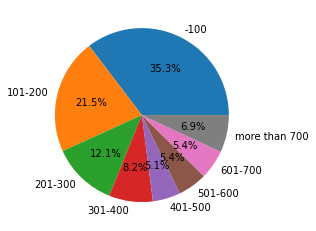

In [12]:
import matplotlib.pyplot as plt


plt.pie(ratio_total, labels=labels_total, autopct='%.1f%%')
plt.show()

In [13]:
final_under2007 = (final.loc[(final['대회년도'] <= 2003)]).reset_index(drop=True)

In [14]:
final_under2007 

,선수명,대학교,경기수,전체 출전시간,득점 전체,득점 평균,2점슛 성공,2점슛 시도,2점슛 성공률,3점슛 성공,...,굿디펜스,속공,FBF,턴오버,팀 리바운드,팀 턴오버,년수,대회년도,키,EFF
0,강은식,한양대학교,4.6,896.576667,56.3,11.9,22.1,36.6,5.998,0.3,...,8.9,0.0,0.0,8.0,0.0,0.0,3.0,2002.666667,198.0,90.0
1,강준구,한양대학교,5.1,1094.250000,47.1,8.6,7.2,13.9,4.300,9.1,...,2.1,0.0,0.0,7.8,0.0,0.0,3.0,2000.000000,185.0,8.0
2,김기만,고려대학교,7.0,1394.150000,67.0,9.0,14.0,28.0,5.000,11.0,...,3.0,1.0,0.0,8.0,0.0,0.0,1.0,1999.000000,192.0,241.0
3,김도수,경희대학교,4.1,907.460000,47.8,11.2,12.2,18.8,6.345,6.2,...,2.3,0.0,0.0,5.8,0.0,0.0,4.0,2001.500000,194.5,497.0
4,김동우,연세대학교,4.4,1242.885000,72.1,15.7,20.0,42.7,4.534,7.0,...,3.2,0.0,0.0,7.3,0.0,0.0,4.0,2000.500000,190.0,638.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,최승태,연세대학교,4.3,1115.721667,50.3,10.1,14.3,20.8,7.490,5.5,...,1.7,0.0,0.0,5.3,0.0,0.0,2.0,2002.000000,188.0,66.0
59,한상민,경희대학교,4.4,922.728333,31.4,6.3,7.6,16.2,4.654,2.7,...,4.9,0.0,0.0,8.0,0.0,0.0,4.0,2001.500000,180.0,24.0
60,한정훈,고려대학교,3.0,560.398333,30.2,8.7,4.2,7.6,3.924,6.7,...,2.5,0.0,0.0,4.6,0.0,0.0,3.0,2000.000000,185.0,262.0
61,허중,연세대학교,3.0,324.100000,10.0,3.0,0.0,3.0,0.000,1.0,...,3.0,0.0,0.0,6.0,0.0,0.0,1.0,1999.000000,180.0,18.0


In [15]:
labels_under = ['-100','101-200','201-300','301-400','401-500','501-600','601-700','more than 700']
ratio_under = [0]*len(labels_under)
for i in range(len(final_under2007 ['EFF'])):
    if final_under2007['EFF'][i] <=100:
        ratio_under[0]+=1
    elif final_under2007['EFF'][i] <=200 and final_under2007['EFF'][i] >=101:
        ratio_under[1]+=1
    elif final_under2007['EFF'][i] <=300 and final_under2007['EFF'][i] >=201:
        ratio_under[2]+=1
    elif final_under2007['EFF'][i] <=400 and final_under2007['EFF'][i] >=301:
        ratio_under[3]+=1
    elif final_under2007['EFF'][i] <=500 and final_under2007['EFF'][i] >=401:
        ratio_under[4]+=1
    elif final_under2007['EFF'][i] <=600 and final_under2007['EFF'][i] >=501:
        ratio_under[5]+=1
    elif final_under2007['EFF'][i] <=700 and final_under2007['EFF'][i] >=601:
        ratio_under[6]+=1
    else:
        ratio_under[7]+=1

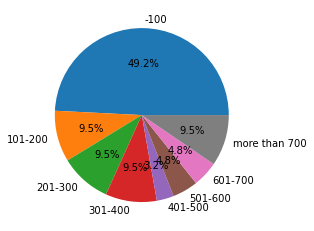

In [16]:
plt.pie(ratio_under, labels=labels_under, autopct='%.1f%%')
plt.show()

In [17]:
final_under2003 = (final.loc[(final['대회년도'] > 2003)]).reset_index(drop=True)

In [18]:
final_under2003

,선수명,대학교,경기수,전체 출전시간,득점 전체,득점 평균,2점슛 성공,2점슛 시도,2점슛 성공률,3점슛 성공,...,굿디펜스,속공,FBF,턴오버,팀 리바운드,팀 턴오버,년수,대회년도,키,EFF
0,강병진,건국대학교,3.6,421.785000,10.3,2.2,3.2,8.2,4.030,1.2,...,1.6,0.0,0.0,4.0,0.0,0.0,3.0,2009.000000,193.0,81.0
1,강상재,고려대학교,18.9,4205.098333,233.0,22.9,90.9,162.4,10.807,10.4,...,9.3,8.9,2.6,28.4,0.8,0.0,4.0,2014.500000,200.0,807.0
2,강우형,경희대학교,6.0,1391.380000,32.5,4.0,11.0,13.6,7.320,2.5,...,5.4,0.0,0.0,7.5,0.0,0.0,3.0,2004.333333,191.0,44.0
3,강호연,명지대학교,16.6,2634.055000,107.6,13.8,13.9,33.6,7.957,25.3,...,6.4,4.2,1.7,16.3,11.4,3.7,4.0,2013.500000,188.0,102.0
4,곽동기,상명대학교,19.2,4611.265000,227.8,19.5,90.9,168.1,8.164,4.0,...,1.5,2.3,0.7,47.5,17.7,4.7,4.0,2017.500000,193.0,185.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263,허효진,중앙대학교,6.1,1244.990000,62.8,9.9,18.3,33.0,5.559,6.5,...,3.8,0.0,0.0,6.5,0.0,0.0,4.0,2004.500000,190.0,311.0
264,홍경기,고려대학교,4.0,1365.050000,51.0,12.0,8.0,14.0,5.710,10.0,...,1.0,0.0,0.0,10.0,0.0,0.0,1.0,2010.000000,184.0,362.0
265,홍석민,동국대학교,18.7,2765.428333,90.2,9.7,27.4,58.0,10.248,11.1,...,2.8,1.1,0.6,12.9,1.6,0.7,4.0,2015.333333,197.0,2.0
266,홍성헌,성균관대학교,4.1,1235.015000,59.3,14.3,22.8,54.2,4.430,0.0,...,7.2,0.0,0.0,6.3,0.0,0.0,3.0,2005.000000,195.0,-1.0


In [19]:
df_x = final_under2003.drop(['EFF','년수', '선수명','대학교','대회년도'],axis=1)
df_y = final_under2003['EFF']

In [20]:
maxr2 = 0
maxalpha = 0
maxrans = 0
maxcoef = []
for i in range(1000):
    for j in range(100):
        x_train, x_valid, y_train, y_valid = train_test_split(df_x, df_y, random_state = j, test_size = 0.30)
        k = i/10.0
        reg_Lasso = Lasso(alpha = k)
        reg_Lasso.fit(x_train, y_train)
        y_pred_Lasso = reg_Lasso.predict(x_valid)
        r2orgLasso = r2_score(y_valid,y_pred_Lasso)
        if(r2orgLasso>maxr2):
            maxrans = j
            maxr2 = r2orgLasso
            maxalpha = k
            maxcoef = reg_Lasso.coef_.nonzero()[0]
print('alpha is',maxalpha,'and random_state is',maxrans,'and rsquare is', maxr2)
print('and variables are',maxcoef)

/var/folders/x6/nclkdm5d2s99l3x9scdkj6m00000gn/T/ipykernel_5100/1343833188.py:10: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  reg_Lasso.fit(x_train, y_train)
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3360594.158573675, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/var/folders/x6/nclkdm5d2s99l3x9scdkj6m00000gn/T/ipykernel_5100/1343833188.py:10: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegres

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3104764.2504975577, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/var/folders/x6/nclkdm5d2s99l3x9scdkj6m00000gn/T/ipykernel_5100/1343833188.py:10: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  reg_Lasso.fit(x_train, y_train)
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase 

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3458660.7639784454, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/var/folders/x6/nclkdm5d2s99l3x9scdkj6m00000gn/T/ipykernel_5100/1343833188.py:10: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  reg_Lasso.fit(x_train, y_train)
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase 

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2855461.914021271, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/var/folders/x6/nclkdm5d2s99l3x9scdkj6m00000gn/T/ipykernel_5100/1343833188.py:10: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  reg_Lasso.fit(x_train, y_train)
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase th

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 852388.1390679674, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106859.79021563008, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1733351.1891497704, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 87009.49882872682, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2106851.752167752, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2467171.8181876657, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1636990.2189024757, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65115.95796485618, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 665038.2560627116, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2404230.647394606, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136042.03463073168, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145234.6151399389, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 704131.8941850183, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103880.0320663182, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 370280.08499300014, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119072.35146691091, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2061424.7890983813, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 613891.5190645726, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 71282.60772553552, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1248844.464120457, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 277621.4219657779, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57277.68422079645, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1472144.5765221198, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 91394.81384128612, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104754.70314891916, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3090646.705953541, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 84913.54033160396, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 105777.00946204085, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174346.45690184925, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1171699.3319615992, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 105450.69793935586, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81413.60531924013, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72793.9982573213, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 94250.06945972051, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103965.72903846204, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 957559.1791858319, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 109498.0894401893, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102407.74903185014, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 105655.39798922371, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114163.91626990121, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101748.76615981292, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48520.981293981895, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115131.92306780443, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58935.653583219275, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 70788.92760558613, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103876.51463140082, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 54565.407791701145, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133356.89572563954, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153755.96770075057, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76595.16006238665, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 82567.95648968499, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128033.1601057807, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111073.83269125223, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93339.6587454062, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 97067.37319218181, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106406.31694888137, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 94382.57798891142, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139236.32884997968, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55471.56867361814, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65409.793477829546, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56822.590142605826, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58358.574899734, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113133.47054023482, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 94878.06389982533, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152249.660612382, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181644.96647329628, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107128.43548526615, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160241.3259776216, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115598.60890976619, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115477.6301602684, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 92582.89779126085, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108875.79800806381, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117358.75802793913, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1234104.0124250865, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125039.87788747251, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 89309.0871523628, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101581.45384695567, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1424638.1067029573, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127902.67032830231, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1207451.396796241, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112475.2476500012, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114840.1037392728, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93659.17034649383, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112103.68195670098, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122100.97484905832, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107114.38467027806, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 82431.79393340554, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115523.36482695118, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117567.3294211002, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 100135.4764772607, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108744.16070524417, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104706.37261032872, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139489.10460864287, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110253.81379758101, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 66172.37780253123, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 80935.43308314309, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 97777.90013977792, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134599.8084800858, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116256.7867795704, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121914.84702052083, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114320.55908924155, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102128.72090350371, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124460.06336021982, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143105.42189183366, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123465.50869865529, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128575.02392120752, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2084294.3773506233, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110291.00964830816, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 95352.30178838223, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115581.36269463226, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 88063.51804900076, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93800.42137405556, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 109543.41313164309, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99547.03689123131, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81614.15472503938, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114129.60023131035, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174425.8644642355, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119532.88715760875, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145450.65559559688, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108274.93306475691, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108557.4705082858, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 298172.98430899624, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104699.898422122, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 240630.47059412394, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116442.90328771342, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120309.57746380474, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116736.47911865078, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 105108.21543546487, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113277.19484722149, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108314.70640775841, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119629.22508804407, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 105697.35542617273, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123887.1725911051, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124168.37240579259, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 279658.14775156043, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114234.62230794877, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127665.04827550054, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102065.19077503122, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1272658.0637762453, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131399.5101006953, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123082.89534675982, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 95565.29559883103, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128144.46222631261, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1445834.6705485163, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137329.12012467347, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133987.11724137235, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119734.02083722409, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121449.87417665962, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126715.85624283087, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 118789.4480452938, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125940.69269892015, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129973.47623182647, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113563.50145737082, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126908.32532599196, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113884.40214753989, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123901.35843751207, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136377.23115534987, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147220.3325642012, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114493.5914201336, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114906.44842829369, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 933083.810681086, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116065.58353652805, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115888.1698400816, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132359.00119187403, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124961.01606018376, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 248054.79308394808, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147336.18643070105, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 248628.9463369595, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147995.90325251129, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124895.38555679377, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144519.50958134048, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134446.71518816147, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106026.02056447603, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121986.65813918784, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141799.56572522223, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123881.0687474655, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125189.12862499896, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122098.9099378027, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107677.5643564295, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 118912.8911758922, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132721.7662709169, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149101.125687005, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131106.2075340338, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133980.03952399082, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1433583.8358130255, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116547.83367606718, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 100380.61226280499, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122444.2729713032, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98104.05752349459, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129097.36189373024, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116743.95237335097, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 109403.34943402279, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106397.05182167236, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120178.51268324908, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11786.152535540983, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127239.06792462245, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152045.7883563377, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 130274.26760648657, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115206.65860836953, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 362130.8073369311, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121445.64225413837, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 118923.64103540406, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127409.40950892307, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131039.36837127991, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126470.48769393563, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117207.67721541971, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119389.33084992692, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120281.38093961123, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132143.82865307573, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1299095.4898426542, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129949.54330921173, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 776658.7708940459, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132463.72662905324, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134286.92458668537, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107177.17485647928, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117009.56211327855, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138717.91360976733, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129396.21007129457, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 118454.20843200851, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132311.59203758277, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83494.54639215674, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146565.39388546534, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15577.768102520145, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125900.65106060356, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 338622.6801508041, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132985.83604493737, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125415.35594234895, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113523.14871787187, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138126.0680946, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120286.97087732423, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111772.17756745312, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119911.8228519028, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 130100.60811728518, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137571.03304928634, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154819.8276448315, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119841.98518483248, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137696.34522340726, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 624721.8293771236, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122328.1513515301, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138545.38104029652, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138861.09855587315, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133871.7326012468, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144538.71331461985, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153208.1856904542, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18166.704277878627, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133277.72735597752, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139498.09269521013, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151386.04531329218, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122927.46109914593, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113461.01212444715, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128559.15281562321, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115288.26477383822, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 130352.57772327214, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132444.3895488875, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125224.24638599623, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113250.50279465597, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125177.77976794541, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113284.6619214844, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153564.60759195127, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138053.6389157055, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124321.61675592791, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 600617.2161386674, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122680.77816626988, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133820.016307191, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128450.84869806841, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102734.40186201036, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144524.09075262956, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122629.58429249376, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117150.0395161314, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114137.0566165084, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125873.16939190123, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6695.075672166422, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128738.06093756948, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158079.5243804967, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135624.6298234798, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115571.47238080017, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 468200.8477083435, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128437.56086330116, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131878.91153198294, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134036.5861284472, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137913.43917677272, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134699.28600399848, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122118.03080278262, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124945.88580753747, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139911.2418886032, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138840.74271694012, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1316765.8828265467, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144653.25232162885, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133968.57255594153, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106155.90748057235, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135535.19626609795, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136393.92434549239, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152155.5317997029, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9062.392391373403, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122536.01928125136, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134018.3222388588, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137852.47147564963, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124413.79781667702, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139957.27680070605, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144330.8353427574, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154537.69343472738, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138013.96706303675, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124813.92434032075, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 347353.3742494518, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149067.62498964462, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160850.4486022154, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119441.29317831062, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124430.0470577078, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 515316.05248495145, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117662.80027703941, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127589.84382103849, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 70694.3673895523, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180157.62755232025, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 338861.01056298986, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158637.6251515029, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143149.91045025364, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 161611.68663723208, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179261.47812888213, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144611.29619429447, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144406.8564605564, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123262.71909791976, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151285.37074732129, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 155859.13196499273, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135175.96315633412, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139695.9009072287, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134302.6718031196, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117570.78173732664, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128746.55775098689, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179639.04329155106, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158158.92500936612, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120758.44430408906, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 142606.9004946025, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 339703.48308655433, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132097.2539107157, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108766.52985373326, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133196.50176226906, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119207.48040359747, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139647.17218051013, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127995.7807282675, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126620.42428898625, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119860.02657448221, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27716.37227818556, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139570.70935422368, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140071.45795081463, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162874.638565965, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150456.81570746657, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127271.32763015479, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 524558.6412756108, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119784.48720403109, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 130215.32971306704, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139282.1796354372, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134632.90513988677, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136780.48359797895, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126685.70850358903, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135096.92982162815, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137954.81915121432, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123906.02886347938, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144228.83271732368, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49042.92121816147, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1453940.0944533702, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 130084.81959666219, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146304.0508419145, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108778.5762454141, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1329710.1152792843, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151278.3682316942, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139905.7131918706, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111012.00768137537, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139780.57371997926, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20122.50528091099, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 159555.43678003363, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5791.28244806733, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137610.63942771778, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140335.77104040608, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143285.05182984564, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136216.59058092814, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146623.25220287312, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150804.11050421745, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131276.96593680046, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143404.58177939523, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 130213.51795720216, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140370.86714289337, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 155613.66456596833, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 167485.5344679989, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128547.11161772534, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11990.294608380646, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 361764.7869354603, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132934.02044425625, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133485.33048756886, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14226.84902265016, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147685.06808014587, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119200.40224465262, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164504.57992023323, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6732.436742161401, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168230.51171854604, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 214368.95159224607, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164508.88874083012, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150401.56117741577, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129240.46543142013, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139533.99378898088, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162555.81495815702, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141035.74001704436, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144231.48028444406, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140135.24110561237, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122672.92678616196, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135694.43057151604, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 235223.89589323942, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 167824.69849435147, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149553.06738229282, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146696.03773018904, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 203866.25886614434, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133034.50575537328, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112783.14694350678, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138303.92786882445, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110041.90035593417, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144932.12509371527, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156163.92825935036, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129548.11867996212, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125100.25335354917, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5508.8704500114545, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3831.340021229349, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146290.55779484473, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168137.02355093323, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144289.42018902488, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133259.8784216605, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 571634.0005828356, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140539.91117497906, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145047.55128499586, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149448.5522326762, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13087.161030655727, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131552.8563705925, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134706.01410960406, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151494.55808702577, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150069.6160658626, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 217605.51460065786, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156661.40668875724, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145300.85001357086, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114806.86110086739, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143164.64668149874, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 142755.1704103537, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165560.49112815224, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4296.630527582951, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131895.48877235036, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145355.1564724259, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147682.548891956, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5995.384052683599, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151985.90912481118, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156447.01329969335, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166846.8028928861, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147922.15555695072, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134604.90013503004, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160822.1148106819, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172657.96300441958, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132122.3824499827, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5492.798092929646, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174030.3585787611, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137428.6270398274, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138322.0259988224, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7414.601238301024, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153665.2870332608, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 86802.74237702228, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169277.51124996133, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5919.514523549005, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 239705.59776413906, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170298.39687487856, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138100.6220025206, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133839.06060615275, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144201.42642051913, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129386.05259183422, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145885.01658698823, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149293.0602315776, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143209.0030073775, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126210.75242154859, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140122.47809394635, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128505.6280208705, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154273.6544449823, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134563.39870012645, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128615.73024335783, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137382.69650648348, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148798.8550438853, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150461.6567798797, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112704.817146115, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 159944.6674437346, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137300.57972477563, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134233.8959793439, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128665.19172715489, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139538.37062146142, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143518.1964017637, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145018.6696504457, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134733.94086589757, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16387.77489745058, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140163.33615086973, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 69279.77096816804, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147381.48345798254, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133548.80005334225, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149192.04531307425, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7034.655327710323, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 276700.46843345, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146181.11535688303, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156532.33287550323, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114872.151078281, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135191.4526513107, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148607.31476860307, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3823.698282324709, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156228.0943275271, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9876.697798518464, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171067.93447868992, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151516.96855475195, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147403.39067385346, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 378944.4510702323, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164912.86955930106, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132360.04319801368, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3864.5982832163572, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132112.49154002964, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131235.1056455206, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 142191.91628880147, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3734.2711138483137, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 271408.4921624819, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48372.77333833277, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 173079.11538901925, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177821.46001318842, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 256969.21161017008, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174899.7083417615, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137435.41848865617, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147894.58098160196, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49789.98117192462, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149753.90339583438, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153334.27780008037, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150847.2624016069, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129074.39059321769, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143707.504997476, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132085.49467151333, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157970.53719742782, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138049.12918534223, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131966.2811690932, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152156.94550185744, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154449.09173756465, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 175195.2392147351, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 163615.51732825674, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141147.94590385817, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 631910.2485936591, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143162.6976022506, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152636.1725351112, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157546.5050158538, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137787.21500376705, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192814.6990275262, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 159751.35601297487, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59060.00891259778, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165067.9377714619, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151369.45339426678, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120648.91961220931, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148300.86014960427, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8007.114286533557, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3447.3341155946255, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150457.44256156217, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158248.50959636457, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148092.64860935044, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134901.5114709409, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2824.4123235968873, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49426.065560841, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145170.97272920795, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1541.5585964769125, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 283403.51753648464, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33598.81612159964, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176007.69917224813, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156672.02934213635, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181071.4075953588, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 267906.36108606495, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 161978.45893459953, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140179.08504941128, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150733.83355652634, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131256.240567049, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146495.6720493734, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134826.6800466273, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160803.1459336551, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140724.91571875568, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134514.60730351508, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154828.19929595664, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157553.48951246403, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177824.5372406952, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144089.26604947727, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 652346.885039161, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152273.240570385, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 155460.5544481706, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160581.54007113073, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3728.419377525337, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 212247.32386224717, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162861.07244967762, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 118436.19446442556, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168234.15528581105, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154033.74762433954, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1258.5000133309513, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6458.374640934169, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177344.10819392, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156951.7903872421, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151828.37795759924, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170391.37415681127, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183014.01173807122, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2630.0737150181085, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106389.67208376154, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146502.89818803687, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 178837.57008550595, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5440.678897348233, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160154.76173682697, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181841.0368947722, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147171.6291399058, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27210.274026687257, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9889.116897709668, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6952.638751525432, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 97218.49299793039, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121812.59100607224, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149410.10287091695, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116820.9020315241, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 218895.76182892453, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 142412.95306848548, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136856.30575352442, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2156.0546172540635, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151286.21937876288, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152395.76011491753, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5575.668413317762, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148299.54510498326, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8986.103232382797, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 142278.3541322751, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158245.05055586807, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124086.93691501953, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153736.43874490634, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180906.0326132737, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3054.475777233951, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158380.66650011577, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158817.03011600394, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152762.4590013167, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19150.008061955683, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147169.26677537803, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16603.54146662727, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17987.29985811282, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156955.82306365948, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 302371.36498057935, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141443.75461274106, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29276.49527036026, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186457.33650148567, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165752.0579840904, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166909.10466405656, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144731.22150690295, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180502.14550431538, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36640.15324390214, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 161573.01193853468, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134795.55012292694, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151158.4852320142, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139368.88914952893, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165546.1111814743, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145186.45939287823, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138681.64651432913, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 159225.92911498807, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162694.5159930708, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182162.6712865485, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148945.21884585544, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 682624.5258981995, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157608.39112740476, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160117.1554294601, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165625.77360350266, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1665.6329021770507, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43913.13996797707, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168005.74335604068, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50346.68071008753, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 173504.89340904728, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158461.7907349104, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2800.5635137250647, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4280.330063987523, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182381.41219426692, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 161390.25053256284, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172481.31793380342, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174950.90241999645, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188203.28148999903, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2887.105395707302, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 94244.09199518431, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151008.6077778088, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5752.263651902787, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170074.87774877436, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176784.29538505897, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5497.973437912762, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165233.2640896216, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158323.2521334095, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151589.6821209956, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17959.37694360502, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 320804.9601955125, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4191.788231422193, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83448.02559875418, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15188.929533204064, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152958.36238025874, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 118764.76255939994, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 173049.74234642927, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146841.35484424513, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141305.63021549582, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152391.02258116752, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 155466.52120059915, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156309.5584654361, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149417.2658158876, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152651.21172679216, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6026.05373560451, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24298.970547831617, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 163050.89906055294, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127240.34719955362, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10394.28598531615, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186513.2284261007, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2735.898978030309, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160340.77965407725, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162836.275743681, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157147.54082647897, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147880.38018601574, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151450.5443169074, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8942.596960574389, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154827.08624381758, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115959.20401600655, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16550.544356504455, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 185479.5233838344, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 792263.9042159519, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189789.16903824918, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153384.07176284585, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 159891.73144962173, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3919.3271362436935, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2032.2887066137046, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 217539.6807489423, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125917.65067710541, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154409.46321685426, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58254.18133780919, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 241178.38411562704, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148624.5821387982, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1516.3517582379282, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157143.3266999796, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157907.71158031654, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4682.139798190445, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154428.92188392393, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5139.137978697196, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148880.3154917974, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165022.4310125513, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128483.87127531413, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 159189.83725227602, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188789.7024610145, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2610.010507851839, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165328.83211128693, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164485.33871164545, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158970.66845853254, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10372.02089312207, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153194.73437301628, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7629.523454271257, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162974.47879637033, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73238.77709814068, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14826.183432602324, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5773.4482928412035, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193418.48753769416, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169207.5502237454, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174495.95055014733, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150520.0841155853, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 161812.81919750106, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14879.921804038808, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 66443.0054336153, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 227092.806721529, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157344.07727796305, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145600.32313826587, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34768.31406075042, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151228.63800301403, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144015.14078006707, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58409.345478186384, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169400.92132866755, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 187921.17335379962, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158410.49695821851, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 266087.6836054977, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164645.9660818819, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 163064.12253058702, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172261.98892894946, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3835.515287699178, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39885.845506530255, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174618.01825849246, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7954.570607766509, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 54932.01042623166, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164282.79958927538, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21273.340263555758, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174607.39261467755, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189131.3832032578, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 167221.9158112118, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8493.297398812138, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181094.44291126076, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 195170.02201849502, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93740.02386268415, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 82963.8446141649, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156902.4525960246, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112399.18165057153, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177195.67830579542, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183037.0936125517, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189084.66889172513, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171746.89861587435, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164581.12252582423, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140432.6282671746, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 84451.82384886965, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 173138.95011386462, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152970.46925107297, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6341.374230187386, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166474.33536857925, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171273.45621259976, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 178967.63079047576, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156980.61052687373, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 175157.1085339319, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158102.2422216246, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168346.0107566584, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174120.43571766, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13092.933423775248, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176458.08743719198, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5490.8764337506145, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182605.26185239945, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165932.43878793996, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27433.770115797408, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 191025.64216340706, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168860.76361663733, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7399.208450552076, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182772.7329317024, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197124.19280862994, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48019.592976883054, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158546.06072647776, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55283.60306161456, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194357.74450209364, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184792.9594977582, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 190926.4489140911, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10625.899407903664, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166356.27828896884, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141562.12542996556, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160789.77771598473, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174768.30422389228, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83176.2033929145, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146869.18658603635, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 173080.62321518734, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52498.289154432714, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160589.42335015815, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120941.12297269423, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168537.6772210542, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166263.2628788147, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14389.350930212066, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29229.702315253206, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 163386.21459775418, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23072.786247237585, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170579.84496041853, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169693.05566416867, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6087.605381646194, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158236.00030748174, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4494.2594109252095, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29507.877345879562, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10851.737920007668, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192642.25692716148, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49135.77516466472, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 198534.8461165633, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 159965.52323900908, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1530.3985973568633, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1838.643865134567, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51277.30634100083, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 159787.25758002605, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122396.61068055406, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181670.8155129021, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150049.9492642358, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160699.64824277814, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171295.7567754984, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 244774.34694946744, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10731.405603703111, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179377.07130741235, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 185891.47053111065, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168552.6345114326, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37722.25610323995, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194043.06957880594, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171470.9198253136, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5758.553014105186, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 200234.67766870093, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28519.87911667209, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3590.965116118081, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26990.26586637739, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 217651.61688045412, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28591.830339505337, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193830.30435444321, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7646.1213119942695, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17818.958172466606, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 163512.00024585985, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151852.9168766262, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9360.962385315448, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149050.01728772372, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31638.81788174901, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164056.52395506296, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162211.7498471411, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3453.5432019243017, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162039.96797343902, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157119.85338209663, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 173305.124057075, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133382.3289757222, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 198411.34867509827, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1789.7354019796476, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170684.8195166681, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166979.6068904912, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 198930.22271693032, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2345.115099397488, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25219.10965952743, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8978.97901371587, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183360.72701395024, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6090.513562001288, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177557.03050694428, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170289.38274466712, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13463.973502187058, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9728.810734365135, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 178399.86513926648, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4338.810564905405, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171234.35328744352, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177041.81492839288, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162305.50468000118, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59247.13959152158, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172766.10324208718, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179878.7137685977, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32496.25124669168, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22623.093517047353, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2215.412747993134, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11959.813990633935, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174767.24702821858, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182601.3826307496, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3455.771653336473, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162023.1998063987, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58282.99459458329, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20189.259017127566, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8657.41909526661, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 202873.95592020266, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27119.849413444288, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 203168.89441362862, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186168.55702728685, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1674.2589267529547, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49551.33465350792, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22713.231327557005, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162495.42523314245, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123904.31650710478, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158497.68170460127, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153776.6415744545, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164019.66516759712, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186133.07127395924, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 773085.1629486582, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8682.390081126243, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14512.737641216256, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 190242.35274487175, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171986.67545066867, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6130.672356309369, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197964.94000423234, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174874.4743034914, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189899.90496267192, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 204302.4310243437, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20389.79397236742, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164583.97497530095, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12746.869222040288, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 246985.35164974816, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4118.238635302521, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10725.266586702317, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152743.45092157554, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 155504.85912290774, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5490.793521185406, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 273577.46386519726, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28210.469341363758, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166960.42167660967, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194476.51232593134, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143979.62677887734, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13901.351345027797, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 191431.66517807264, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135513.95391229726, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1653.068462391384, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8469.845171008259, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174421.6988949906, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 185311.5567594897, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 190795.8343898626, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65389.65522184968, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165502.5544590503, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10682.860470684245, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 198540.42521853652, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3218.5499222595245, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9618.293746713549, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73537.1826146096, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156512.9912261581, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4875.040344789624, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152690.74452831503, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27929.956228515133, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 167723.11192883924, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2919.5469972919673, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 95926.07744788658, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13316.905191741884, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136038.01982015278, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1384.6716150734574, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10164.107214965858, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 175433.6152510317, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186187.42041062377, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 191654.51162014157, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63334.103617269546, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166396.10325167794, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9040.733933746815, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 199497.40829870664, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2358.972785955295, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8772.89238961041, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55800.727482985705, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157500.5171896629, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4394.339535395615, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27773.96279036533, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168455.38054348808, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 210377.91312634107, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 71196.91640639678, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1469.357036032714, tolerance: 1163.2123914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12755.451596368104, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1125.882105557248, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11898.337719756179, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 201052.6885394575, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192478.48429342452, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207805.50351226702, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13662.16215630062, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7734.6974689196795, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 269470.4608377125, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8588.067493905313, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8160.13081155438, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172459.72566184308, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10396.005928125232, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 283049.08061636146, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 161796.27288090903, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157737.90263590403, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 217918.57298680302, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 250674.8506430555, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5353.540946337394, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12215.307347785681, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194855.3015850531, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 175572.58503330033, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12254.200446705334, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207766.75982586015, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15547.634606137872, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7630.186229661107, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 175885.4725103192, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5186.219816387631, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8841.146617444232, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165771.67063101847, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125846.90802032035, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158680.23979532998, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65543.05455258489, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179711.15879578888, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5263.120490525849, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188132.55589829944, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1347.9324616231024, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176412.24327748828, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 70222.28009342123, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188912.58974943776, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1370.192516664043, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17096.656682558358, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14743.831466415897, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 208652.55696030613, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14311.918714853004, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 210296.80045074038, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2405.996254717931, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1335.9954015994444, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47755.18813740369, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166358.09952891804, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126338.13252909947, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 190953.83341045212, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45483.95112234447, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180558.93885386176, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135570.4986262573, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189084.25447702128, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1228.0381565410644, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5024.07737243548, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73744.5689642625, tolerance: 1122.050664171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189872.56757126376, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2137.23707661964, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14605.141479199752, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14016.043472256511, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5415.5276841325685, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13281.332619351335, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 211384.670373559, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169184.51955691632, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1279.32104915753, tolerance: 1121.2213411764706
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47598.1813702723, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2172.74333128985, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126828.294324263, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 191867.7745199995, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57738.022347843274, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181379.41293880343, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101115.62698644493, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43778.37536545005, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1111.1363217970356, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4252.997468309477, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182479.79015939496, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 190806.51908476092, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4259.767311003059, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 95630.93944692612, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13315.947873518802, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5292.559340880252, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 204208.29873398878, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 212443.4882091591, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169909.73149979673, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14089.032607524656, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47492.60576439649, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1930.3754940703511, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 178035.76670929603, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192799.05057954602, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46956.167450312525, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19205.20803363435, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 80628.08465468511, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38036.50437010825, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11944.551400264725, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3512.1668938696384, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183341.57790199667, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160774.29191190097, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6497.889783860184, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 74155.34333680104, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5192.943133496679, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5172.705603864975, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 205547.96345218364, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16555.16257738322, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170609.0381066315, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13755.971366535872, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4179.06550202705, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47389.99402820878, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1693.2197047276422, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 178650.98993137106, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193782.07437656075, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39046.98945438769, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17645.69193767663, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65746.11846845131, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35255.684442121536, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9320.27895725891, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2792.134650903754, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184177.36803277116, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101238.30872505251, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8815.523948325776, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58886.93304122612, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6476.1788579355925, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5059.538596880622, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207369.4123841934, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18476.111986713484, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171282.55148135498, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13433.521978270262, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4452.1393341086805, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1461.13316077739, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179237.83138783742, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 187710.77753252815, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33023.133676905185, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16298.491666924208, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 185230.73082151636, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33631.63531235326, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9115.109282958321, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 70326.00054670405, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184987.1455246294, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 74307.653401413, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35939.638441788964, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47749.371538952924, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7786.741831974126, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4222.8829593537375, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 210105.4741489319, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20241.437628592364, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188945.64115496632, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13120.624162562191, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4937.501348470338, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188012.9101323858, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179797.28309487365, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188521.3854615353, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4879.119370504282, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15127.66252240166, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186284.85587565135, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179495.93470146786, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8909.147827562876, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50600.65303789079, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 212770.62507310137, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57856.304067457095, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31330.63273058925, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15361.718086468987, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9118.32768988423, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3969.839507956058, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14249.71654801257, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21561.805275367573, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189733.3572296705, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182329.95381707884, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5706.328947685659, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188681.2745284317, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4083.9853456690907, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189305.4813497644, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4528.052401063032, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13132.61877114512, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 187318.99485875852, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180146.0783494152, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16178.188055017032, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38692.731415185146, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 213838.49786819145, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51247.69903729949, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27521.265718954615, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13749.491852822714, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1376.4997271904722, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3728.392085242085, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14615.175393923186, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 196499.87555441633, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 190494.7907225825, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164227.55522588082, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 152944.63030848838, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189322.1219549179, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4007.837064226158, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122817.9623911269, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180772.12375862803, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13940.734067878686, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186690.99999934435, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 214888.5742260702, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43621.55018641241, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194551.6677164985, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12414.558349207975, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1332.2852088399231, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39583.15855199192, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114707.38769063912, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153531.96291074436, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12529.874099371023, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3932.7744413046166, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 80304.39886462688, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29652.167256474495, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12126.14042312093, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 187346.46743734274, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103905.49924904387, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37689.318348893896, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 185195.94341561198, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 84723.79202001076, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38474.398921460845, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25339.925740558654, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2641.015886362642, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207856.55871930066, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60202.11160228867, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3255.741760429926, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 167325.0229357509, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1304.4739302005619, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149862.30235514138, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2735.609740654938, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107712.14796720631, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93237.02886002325, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27532.860424474813, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 210572.4685318442, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6509.966288214549, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 220603.8662252715, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5729.7914717160165, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12032.829890522175, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 271197.0431586765, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1782.1916904505342, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14365.534271409735, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46180.5750498306, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3448.0732100512832, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32036.21693553496, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168689.87621833477, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48052.722437121905, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6372.040453961119, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38681.218275227584, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4415.6709519810975, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 196633.48755479231, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31978.844081829302, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197707.20330781676, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24743.552246963605, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4714.659763894975, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10022.34334714152, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3196.142241364345, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8779.452893860638, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 220270.10397585202, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 175016.00443547685, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47292.68307153229, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182623.69457864016, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192506.31806415226, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14545.827913561836, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10523.020333981141, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 191660.6959166173, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31076.306288653053, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3735.0815813252702, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17254.72553689126, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189572.9120189743, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21645.30758579448, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17067.370196559466, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28184.318642781116, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193596.43944857735, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41256.66731639579, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7716.810159207322, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192436.79709192552, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3677.2439471380785, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192469.04551253747, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183769.10023852438, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8028.271268528886, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15210.419633060694, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 219687.88098219596, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24320.79809148889, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15735.015784183517, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8573.161576403305, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1126.1278358558193, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194212.32296978775, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33028.963810455054, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135416.22244504374, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193096.43323299382, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3605.8252563895658, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25246.753643926233, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7282.206956516951, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 190617.47317853943, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56995.112096776254, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21750.448895821348, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53740.700852767564, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32524.513190949336, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34151.59183887392, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12680.35106376186, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2493.625867967494, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5805.651249232702, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 77660.97026448231, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56879.518170444295, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5905.977428020909, tolerance: 1109.6981818181819
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2124.74533250276, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10383.815840297379, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6660.463863042183, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 191277.28531375714, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50900.360942959785, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1333.9159716358408, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19551.386332225055, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43696.76974896155, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33313.37143500429, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11129.102681311779, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2408.532672812231, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4187.399567231536, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65596.78735085763, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48388.375260851346, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28217.90847384464, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4495.956717185676, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38123.66738063004, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32277.395706879906, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134765.88452620152, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3286.4882801659405, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72157.56479353737, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4452.47542687133, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22404.408830970526, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73484.6814573491, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11632.715874876827, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6560.481171636842, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 77785.02942911908, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20029.188685727306, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4598.992349838838, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32606.375816825777, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4005.3620525971055, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 200374.70004772395, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2883.101964845322, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7140.711436692625, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3051.192416493781, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7927.602395191789, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224611.97790641058, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114694.27276646625, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43830.58524790965, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5957.983218033798, tolerance: 1101.5183229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184887.1634793207, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9701.830657549202, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8110.101975908503, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 195808.55540196877, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21391.602553612553, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2999.221219859086, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9898.290833996609, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192510.20196211245, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11847.756673623808, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11783.739266226068, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35819.89916224405, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 196656.43917687144, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11549.76619577501, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6887.430582773872, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 195795.37425473798, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3297.265127961524, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 187447.17020320613, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5118.102649436332, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193560.59920412954, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 228272.99736135453, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2880.3501163059846, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13966.488445585594, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6273.218217759393, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30661.401656650938, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7833.952940566465, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40460.033573552966, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3959.1521009448916, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38294.80824937858, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7246.099509777501, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30133.896712285466, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5603.272432585247, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3335.9495621928945, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73142.90344397351, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11896.307310467586, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2161.292114397511, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12426.440186020918, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20106.538510007784, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29972.149016524665, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7271.678900139406, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2024.613141595386, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32997.19309644215, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23955.2724314332, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39720.337733336724, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5915.688562446274, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21118.02870547399, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23239.676916010678, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34369.235368966125, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2842.948222658597, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2399.8974679810926, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3549.481276781298, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2890.599768797867, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45264.8225960657, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10010.886856392026, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8313.209049755707, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43482.46945608221, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9929.780174594373, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14635.506939517334, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 245600.93549515866, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 131857.5075814724, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8034.599839289673, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18906.239509560168, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31253.460398684256, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194033.92062144633, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8967.949389881454, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28905.97221991606, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41798.97676902916, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 198191.2513396982, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9183.496908199042, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6297.937696580775, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197574.8694523098, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 198806.97126803081, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189623.47736173496, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4011.336332413368, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7609.222088245675, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 239128.8991400944, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1701.7782980799675, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8459.568695060909, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5520.091856133193, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28359.325550106354, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7813.914881993085, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21153.581427712925, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3708.4787078816444, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3005.1056634383276, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5385.78009380959, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32081.343761601485, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 196035.2958999714, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24538.210544650443, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37967.32177909836, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4974.346103758551, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13629.570224694908, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13081.918129172176, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27753.074505162425, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5763.831798848696, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1733.5628238590434, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19644.58045126032, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9382.91382867936, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23510.689729159698, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6997.708690827712, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14768.982203350402, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15283.506984575652, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16396.355135968886, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2586.739151273854, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2181.459405608475, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2884.903133314103, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1800.321992494166, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22208.46374475211, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10222.528941920958, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5523.074546165764, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43336.56731277518, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62920.944026202895, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6427.173170899972, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17927.711759218015, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42710.556838585995, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 195615.7375692483, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6739.82372824382, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18228.622427916154, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43744.735866013914, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 199405.32047263905, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8728.818349950016, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5610.29412236996, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 199067.1387007637, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 200860.34244352672, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107826.8789166063, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2972.8235321491957, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6699.059147608466, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 253186.16518803407, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1446.710672113113, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6085.44556194637, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5069.421825683676, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26272.948632803746, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6591.35477214586, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11128.305621245876, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3450.160390080884, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2787.275270069018, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4415.68231158983, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33884.98823983502, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197645.41454495117, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18689.647979028523, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38700.711813475005, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2895.267141313292, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10011.677369608544, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11390.068253930658, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25698.317664161325, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4403.551683034748, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1303.395310593769, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7761.773705477826, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7538.963343963027, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16207.491817886941, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4695.7873743334785, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11163.57241858542, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12738.032255249098, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8646.26989626605, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2344.2804632484913, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1841.7054993100464, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2268.8515030751005, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1405.1436966182664, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13774.696811969392, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9275.484542647377, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5392.595672307536, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43314.33715481125, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3970.1977814109996, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39022.799246717244, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5802.349352667108, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18132.781443850137, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55046.68864384387, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177308.9754986288, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2750.83467935957, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11039.08639514912, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37007.39126372058, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18180.919152443297, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8308.043317284435, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5324.846041971818, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 202663.87586325128, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67272.54506416991, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1933.5667830277234, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6168.504647973925, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 266069.4118259009, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1386.9126797886565, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3889.249469907023, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4262.997230483219, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24336.374356133863, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6180.2473561307415, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3087.768522374332, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5392.323765607551, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3882.122158662416, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35557.08108348679, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4033.7770438659936, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39990.39254036266, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6416.15513250418, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2178.7389468438923, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10064.220647223294, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1856.901920164004, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1250.578074852936, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12811.380803680047, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8050.587637977675, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5559.8142799837515, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3532.1203245995566, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29390.979520040564, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5372.072725660168, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13476.194880378433, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63639.36071903352, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115033.08755926695, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2695.491512454115, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9271.455287036486, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29488.37160631921, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13874.109464703128, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8020.543766652234, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5127.843582038768, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 203928.53599716537, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50456.43759892881, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1418.636111191474, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5785.190032844432, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 274620.41840381734, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1390.6896703811362, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2442.3844233509153, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3998.77062494494, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21212.00217457488, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4181.877794438973, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2880.014464643784, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4847.850369850174, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3624.2022995986044, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36687.149779842235, tolerance: 986.9593090909091
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3865.7276397384703, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4770.950376408175, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2006.5197030259296, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1722.3257411625236, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1464.0287345023826, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1146.4978851024061, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19737.393950724974, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7686.300281994045, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3654.8910856153816, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7936.606348768808, tolerance: 1220.7205807486632
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22836.12251292076, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4955.30112640094, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10287.021801714785, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 71989.72985147219, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143514.4669250911, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4005.7055855356157, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170357.30917508714, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4858.401061089709, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3073.59687981382, tolerance: 994.3186278074865
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116303.04406112805, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2281.0915196873248, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3460.8384842230007, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41758.02775146812, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4335.8157415650785, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1689.3334473716095, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7034.15548187308, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1236.2189458021894, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1099.054546433501, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2532.020814913325, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5400.281590903178, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25723.62211108394, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3108.716666606255, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19611.258896051906, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4711.974880021997, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7241.269455021247, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76873.388918248, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112139.6991758421, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25825.072751171887, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 132016.34445869084, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4725.231178772636, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4697.2331349197775, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99479.95350028481, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2021.081331149675, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42408.55227462668, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3985.3738797130063, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1663.2485607638955, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6599.71322393883, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1014.0010140556842, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17486.06232785713, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2493.1782275605947, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5007.295147516765, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20865.215358081274, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16396.065802389756, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4473.803351605311, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9678.121937616728, tolerance: 1166.3985818181818
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81641.97978867684, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 89809.0071698688, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3730.7028941847384, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104275.98197431117, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4593.458631647751, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1291.0041328016669, tolerance: 1220.1283294117648
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83933.34460719023, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1424.0215583071113, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3266.6733484808356, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43043.508184855804, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3696.0101814428344, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1633.58995431941, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6241.750472267158, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16555.129602004774, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5475.685481807217, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4677.493941516615, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15674.726877523586, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5608.012069846503, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4240.275812091306, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1820.4544371850789, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5123.722954868339, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7627.552242374048, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26395.524547625333, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7136.111959758215, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 70473.84410641901, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1408.6871074903756, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3203.8446871377528, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43668.43596649729, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3455.529216325842, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1601.6147574009374, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5893.617292433977, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15651.142971479334, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5320.557968335226, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4372.825694349594, tolerance: 967.9694951871659
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13487.370910506696, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5431.131658715196, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4011.581496927887, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1783.1354139493778, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5004.9262836826965, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7275.9767305338755, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26821.86573543027, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6411.719235282391, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59233.12702383101, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1392.1094409758225, tolerance: 1179.958365775401
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3141.6209688987583, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7939.029178448021, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38608.96482499875, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3254.6102753113955, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7583.7929739598185, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6633.607393837534, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2568.3886340223253, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2603.10824529361, tolerance: 1075.3545229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9424.259118106216, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3787.718055847101, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3061.2284586345777, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6958.460810675286, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27281.784995482303, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5170.441796635278, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22786.599803139456, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62902.23875085451, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4935.417803891003, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1175.9572635777295, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13832.209660412744, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 68632.49889588635, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1504.4371613496915, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2756.8903056886047, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12296.782675162889, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5220.035005895421, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5743.277959596366, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8965.246163880453, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12035.780774813145, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2331.97840558365, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2237.560812403448, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2262.239846165292, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4921.944516820833, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4658.0677866227925, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1236.6289169797674, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17783.812023418024, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58202.698371428996, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1535.9890117887408, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2734.2964289914817, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4536.898175965995, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11918.652245177887, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4953.956225367263, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2545.7885951753706, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8789.931002233177, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13214.86485370621, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2556.879063438624, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1420.952427757904, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2003.886574614793, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11268.717029591091, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4413.69716609735, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1349.2115874364972, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4566.053874102421, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48876.20815245621, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1570.1747888708487, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4424.326221805997, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4296.288276239298, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11321.698706142604, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3389.1263519516215, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3285.9197629615664, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9242.45448571816, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3877.6911345813423, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2412.5607952093706, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8616.154187271371, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1436.8134960513562, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2745.399631817825, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1380.394576644525, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11367.929888519458, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4634.932657856494, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25234.11204433441, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15792.120383922942, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2015.855334234424, tolerance: 1106.1288566844921
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24103.088753869757, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1610.3466046182439, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13918.398779286072, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6225.888664466329, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3303.4631511317566, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3483.1209455141798, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8931.126315954141, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3908.781444796361, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2277.929882842116, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8426.064350673929, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1399.4764542840421, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2940.062799587846, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1339.6042962502688, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9315.705160662532, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4495.773106516339, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22454.59538253676, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7408.187588023953, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4116.285621099174, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1366.0043725846335, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36082.47939705197, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1647.0908564440906, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2660.7984636668116, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1849.250079093501, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13605.210828319192, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1346.5968667743728, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3226.71096334327, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3679.4430757965893, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8653.952252736315, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3938.944804493338, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2139.3889634581283, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8194.810220303014, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1361.7674113558605, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3139.347343721427, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1298.648581543006, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3711.2112996112555, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4359.151594306342, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20081.456664828584, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4383.098890719004, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4166.796925791539, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1253.9411309706047, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32249.015872330405, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1688.939929842949, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2634.9956374894828, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2079.2896586358547, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13308.377023715526, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1820.7618433050811, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3157.781689519994, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3874.943426873535, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8407.499444393441, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3975.9030433604494, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2009.755954674445, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8014.82089221105, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1323.8277560109273, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3340.9765512812883, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1855.4947052169591, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3391.098824906163, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3927.2662242911756, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38566.23860044405, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29070.813535885885, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1732.6108126211911, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2608.4873010739684, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1371.7230157433078, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12987.850480124354, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2291.4243525229394, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4069.723164747469, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8190.171150960028, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2433.335611061193, tolerance: 1020.8369625668449
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1933.0281329229474, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7818.784152459353, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11005.186547122896, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3542.250028147362, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1812.5661870613694, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1981.9542655330151, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1998.6262578712776, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3252.1576174581423, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3705.877441810444, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2441.0187369054183, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2114.859090280719, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3704.733112080954, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36005.85899038706, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9804.981779107824, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3775.640025257133, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3310.689409517683, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3040.2740390719846, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4262.414666299708, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1294.7610947778448, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6159.914372107014, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4680.261701676995, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 967.587369271554, tolerance: 964.9266919786096
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1436.543236126192, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3963.770530335605, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4951.773008191027, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2850.6788655146956, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3252.694424651563, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8110.976745433174, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3002.8078295663, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2008.7626609709114, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3202.8255111910403, tolerance: 1146.8614010695187
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2990.459357912652, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4455.088615302928, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1273.2341384058818, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5923.335465484299, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4589.278460015543, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1411.023546051234, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3836.6088076243177, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10211.075231404975, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2943.9650492016226, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3277.7441777093336, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51228.79061037395, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1874.0838666642085, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2523.270852053538, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3107.826786226593, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3671.233303689398, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4862.1345380349085, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1782.0225747730583, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2172.575106535107, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3570.549517152831, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1691.6061873435974, tolerance: 1032.472780748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3588.9936182098463, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13377.123598864302, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20044.28044695314, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51239.88357817102, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1243.225012392737, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5634.375497233123, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3589.5589362783358, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1374.6167209437117, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3670.5287183746696, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4246.271277415566, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3497.7089729774743, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3158.6242882870138, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7277.313134091906, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2918.887254672125, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1911.3201339533553, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2809.3776544975117, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2411.3161852145568, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7495.505950083956, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4398.672110978514, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4290.109264717437, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1662.6794560076669, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2526.2425193618983, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5425.753311553039, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2485.487700981088, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5972.805524808355, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3395.6761295637116, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21898.667638258077, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4681.389788305387, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2030.1560516925529, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3877.964124759659, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1783.3784051081166, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2996.613286611624, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1742.2287459438667, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1266.697987716645, tolerance: 1197.356962566845
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2471.7245164569467, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49282.53333712276, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2470.2927562398836, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9705.267009395175, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1803.6960389595479, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21784.75707754586, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2195.644377260469, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4708.25112922024, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2185.324213209562, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4186.760619864799, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1859.2061789296567, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1599.0217957319692, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1247.2192292204127, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2474.1705371225253, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5621.107872922905, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3411.7759140245616, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2955.626975026913, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1430.0825303010643, tolerance: 1041.3177625668452
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4946.856521285139, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9204.28084597364, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1544.9736857991666, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3306.448443431407, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11598.241647362709, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1435.0608922615647, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16015.52818488516, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1155.423760687001, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2385.627667300403, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2696.5062806149945, tolerance: 1190.1081679144386
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2058.9672579579055, tolerance: 1199.044068449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1550.9725139951333, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3494.0285181971267, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4699.1564685544, tolerance: 1085.500071657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6389.2961626481265, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2795.1557472385466, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1608.8800883926451, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2535.2570372838527, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1342.2566235363483, tolerance: 1147.4177090909088
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7020.8105187239125, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4110.228319246322, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8661.536555876024, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2352.4301464641467, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4960.114960292354, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2305.563041014597, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7878.260473657399, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2111.5468105915934, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2358.4323918586597, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1417.8383823698387, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1826.7862878451124, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1681.869858535938, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1416.7002169005573, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1771.0185622908175, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14971.229588402435, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2210.623137780465, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9794.327608771622, tolerance: 1137.9149807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4009.967742989771, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4285.201246115379, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8540.316970845684, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1985.6625636005774, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3055.1693238662556, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3112.2642698548734, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10238.66136544384, tolerance: 1062.7581229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12576.943742524832, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11316.412423338741, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1087.8695276034996, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4576.489964639768, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1666.9563341420144, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1231.1326507739723, tolerance: 1178.6787860962565
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1700.4199443999678, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2903.883672534488, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29840.51148283109, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6931.206721034832, tolerance: 1158.5620588235292
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1653.733267380856, tolerance: 1104.8374737967915
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1720.455754518509, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10872.649723071605, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6693.827971879393, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1372.218889418058, tolerance: 1133.3547978609627
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2706.719591844827, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3907.8985097026452, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5121.467836459167, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2259.167409042828, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4271.458619941026, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2209.24506109301, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6217.770796384662, tolerance: 1310.6223176470587
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2028.5065323226154, tolerance: 1272.4075443850265
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1673.6075298497453, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1285.965299016796, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1800.3072463842109, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1631.3712756978348, tolerance: 1093.2788588235294
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1384.9035903383046, tolerance: 1157.005468449198
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13226.723415212706, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2363.088978932239, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2216.645342086442, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4101.738222696818, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4052.4064343599603, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1349.7776368204504, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2955.649047795683, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5742.95859129075, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2652.21938624233, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9827.44982346613, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2385.9548448706046, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6496.657801286317, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4218.221092445776, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3784.4189330805093, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3710.3620023662224, tolerance: 1156.7722951871658
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1182.6435809787363, tolerance: 1107.084201069519
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3645.145401891321, tolerance: 1198.2264385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2162.7978562470526, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1655.7166248084977, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1141.5582754975185, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20973.89346405398, tolerance: 1252.3133860962566
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2848.910326395184, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2833.8043822953478, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1786.2289499649778, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1708.8656500447541, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12363.722054839134, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2459.558864911087, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4172.155866502784, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3910.122532392852, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1276.0269925585017, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2823.1960616949946, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5510.855248539709, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2598.052682784386, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6647.055568473414, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2353.3711467133835, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6304.215636910871, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10413.555256960914, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4825.468174109235, tolerance: 996.4722406417116
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2713.1876316694543, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6266.2351158363745, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2441.777976314537, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1812.2777628358454, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 61515.506609280594, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1327.4468654813245, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3125.7214886313304, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4712.554701179266, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7476.124667267315, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1804.042652583681, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2883.343867507763, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6468.452949786559, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2334.67694847472, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1349.9413277413696, tolerance: 1153.1617657754011
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8467.94801224675, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3888.190131184645, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1814.8335271850228, tolerance: 1093.6005978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1588.2701794430614, tolerance: 1139.090944385027
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5173.772782138549, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1856.6174765955657, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1365.9972813390195, tolerance: 891.8483176470589
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1144.058624134399, tolerance: 1123.486464171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3082.724068481475, tolerance: 987.0330096256685
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2013.0560879120603, tolerance: 1157.2217978609626
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1766.9873933158815, tolerance: 1173.337264171123
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1710.6329171145335, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11657.276120088063, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2530.1098611233756, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4175.171959217638, tolerance: 1154.1848385026738
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3686.9461087780073, tolerance: 1148.8534951871657
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1108.9623947236687, tolerance: 1096.4281069518718
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5197.278372053057, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2512.351411221549, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2787.5232271431014, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6005.021107880399, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2404.046871685423, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1643.3238018266857, tolerance: 1099.3746010695186
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2079.347467262298, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62757.35480297916, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3038.466441483237, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7251.983026610687, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1722.4840421844274, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2715.0166979571804, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2293.0169635992497, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5931.746286836453, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2391.1073377421126, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2063.65558055602, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63087.86062495876, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3021.7710853256285, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7189.041895059869, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1698.8567322250456, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2693.459576094523, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2281.380984085612, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5859.081245162524, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2378.0481216479093, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2050.121813053265, tolerance: 1109.6649679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63407.73900418915, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3005.2807547012344, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4608.159522706643, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7126.519489646889, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1675.1083520222455, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2269.7990211416036, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5787.075223209336, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2364.8848882922903, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62823.43422845565, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2988.959575950168, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2356.597988180816, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7064.461570826359, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1651.1817392669618, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2646.4945216001943, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2258.1869411468506, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5715.696925936267, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2351.644827570766, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63287.29942976311, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2972.7636868115515, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2337.021985829808, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7002.782517508604, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1627.1124903410673, tolerance: 1069.4805101604277
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2633.284183565527, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2245.619404195808, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5644.904081330635, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2338.3373724836856, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3311.333217206411, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3244.603918818757, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62872.51991051715, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1939.309370027855, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4790.839924965054, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4551.7674796283245, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1184.6922395974398, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2527.545885808766, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5443.761690089479, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3236.0949493916705, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3199.5469537116587, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62702.14955532085, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1925.6668662652373, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4755.420170696452, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4533.0482494598255, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1166.9550825841725, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2511.995471017435, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5323.253411329351, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3160.9317129440606, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3154.769197278656, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62647.32355207857, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1911.4240184389055, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4732.540642496198, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4514.343442317098, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1149.075779883191, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2496.559903740883, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5204.222007770091, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3085.976110111922, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3110.4295568000525, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62653.00708302017, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1896.906447963789, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4710.078814407811, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4495.687447838485, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1131.1072395881638, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2481.2564371079206, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5086.50673273392, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7103.958821427077, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3011.2066743467003, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1238.3607373721898, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1882.2806976186112, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4686.581247262657, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4477.08889300283, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1113.0950381420553, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2466.05210413225, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4969.904571194202, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2936.28054396715, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1294.834239746444, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3022.600152942352, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1930.9213145058602, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1867.7539598029107, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4665.411462433636, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1095.022136202082, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2450.945175403729, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4854.617305437103, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2852.4170978125185, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1351.661456699483, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2979.1960978303105, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1852.7809716444463, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4646.313220022246, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4440.016462936997, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1076.8947983458638, tolerance: 1068.8718096256684
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2435.9437093194574, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4740.709451307543, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2779.9787295768037, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1408.7752477321774, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2935.9478248972446, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1837.408271593973, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4628.491945963353, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4421.504380442202, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2421.019419646822, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4628.047109772451, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2140.726256270893, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2707.4019190287217, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1466.132557108067, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2893.5881887972355, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1821.7927537541837, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4611.946117675863, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4403.020465395413, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2406.1883981423452, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4516.626352449879, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2126.976210711524, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2634.9877328891307, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1456.5734924925491, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2851.8556716376916, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1806.0674677230418, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4596.020863024518, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4384.583317066543, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2391.4263287940994, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4406.803484031931, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2112.5643388796598, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2562.771377163008, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1377.7982532624155, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2810.270363204181, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1790.3373999493197, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4581.417851408012, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4366.183368115686, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2376.7508609965444, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4298.173663861118, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2097.172584414482, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2490.706186575815, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1366.9286253089085, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2768.4281285163015, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1773.5987547496334, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4567.779533335939, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4347.829664752819, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2362.145115970634, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4190.720961553976, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2080.4412822742015, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2418.655318650417, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1364.763977745548, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2727.113315586932, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1756.5857110396028, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4554.482724618167, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4329.5235137771815, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2347.625251066871, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4084.4815593184903, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2061.9087076168507, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2346.603024926968, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1368.0082805156708, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2686.012658965774, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1739.6403630869463, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4539.8128457553685, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4311.219411707483, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2333.1854200987145, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3979.550154974684, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2040.4810461159796, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2274.513796888292, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1374.6886313557625, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2645.185289519839, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1722.8373681642115, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4524.278752202168, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4292.932187059894, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2318.7754025012255, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3880.7392437802628, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1907.960960894823, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2202.348635558039, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1384.1294495351613, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2604.5407539745793, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1706.210570978932, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4509.918749816716, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4274.684423180297, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2304.457957114093, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3786.471161694266, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1845.533443032764, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6733.229292815551, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2130.114004137926, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2564.1423507509753, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1689.433367001824, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4494.100283506326, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4256.461314884014, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2290.2196101937443, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3693.087275433354, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1768.442526211962, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2057.708968292922, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2523.995323050767, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 61535.60842369776, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1672.6961177308112, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4473.754522392526, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4238.2799761053175, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2276.0332846399397, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3600.5868141483516, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1638.10855096858, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1985.072802182287, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2484.0994542352855, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 61534.47182552051, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1656.0466507682577, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4444.319673141465, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4220.141150156036, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2261.9089796990156, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3508.6872713267803, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1624.0485294088721, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1901.918848466128, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2444.4356951462105, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 61535.072734186426, tolerance: 1192.64009197861
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1639.5503820963204, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4390.976667996496, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4202.020954318345, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2247.8078528419137, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3417.4643167331815, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1611.8164907041937, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1907.3238905537874, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2404.6595225622877, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1104.7453240873292, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1623.0649729100987, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4041.6335461530834, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4183.916271149181, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2233.7349121589214, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3327.0925628300756, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1600.900540418923, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1885.0575540419668, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2364.9952414082363, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1128.7294778348878, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1606.5834273435175, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4055.2417745282874, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4178.162005899474, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2219.712792831473, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3237.645705970004, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1590.9326447537169, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1852.7130389688537, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2325.535258071497, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1152.7457963488996, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1637.3372274842113, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1590.1901316866279, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3723.583555055782, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2205.711137955077, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3148.9998793294653, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1581.086892016232, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1815.810326455161, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2286.5950567964464, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1176.6963466778398, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1573.8314274288714, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3574.1145490650088, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4098.458819963969, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2191.769113193266, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3061.2195346141234, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1571.9637768846005, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1776.1927122324705, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2247.865629612468, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1200.4846030948684, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1557.561628102325, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3533.0851042969152, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4074.579237054102, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2177.8609001813456, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2974.406071715988, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1563.615447129123, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1734.7315480858088, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2209.3298542890698, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1224.1134550850838, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1541.3712027994916, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3503.0366239473224, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4052.581923057325, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2163.962009514682, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2888.43906680122, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1556.2378922216594, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1691.8028164645657, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2170.9940507439896, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1246.5507209729403, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1589.3014121484011, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1525.21351682581, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3473.4220586763695, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2150.092493677512, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2803.2641279427335, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1548.9466221779585, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1647.593387534842, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2132.885430632159, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1268.8702187510207, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1509.112825654447, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3444.2396741965786, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4011.4967880332842, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2136.2523672720417, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2718.9015239560977, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1541.700812309049, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1602.1875341711566, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2094.856644384563, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1291.2002949900925, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1480.8874858105555, tolerance: 1088.899695187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3415.4900360638276, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3991.8824662389234, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2122.4611137136817, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2635.065232512541, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1534.4553961763158, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1555.6133721219376, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2056.403595034033, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1313.6334494445473, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1533.4254366438836, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2037.2015147143975, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1325.0764390155673, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1508.8562001287937, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2018.0574146155268, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1336.428167713806, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1488.8226263877004, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1998.97642329894, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1347.5908279279247, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1468.702547376044, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1979.9548335298896, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1358.7125071920455, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1448.6184498863295, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1960.9903493151069, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1369.859939802438, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1428.7068955311552, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1942.2582019139081, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1381.034462057054, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1408.957291206345, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1923.5687789497897, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1392.2088694414124, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1389.3746900418773, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1904.9339000750333, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1403.415487411432, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1369.892994346097, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1886.3508641459048, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1414.7664872650057, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1350.4894999023527, tolerance: 1219.7055914438504
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1867.818687866442, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1426.2757863923907, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1849.344530343078, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1359.1548141129315, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2452.641592271626, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4783.116467165761, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2055.0178300859407, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3186.9763922784477, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3167.191409680061, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1851.3665192471817, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4552.026341164485, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1846.2590095289052, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4538.893256183714, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3074.2301957765594, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3054.1675280360505, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2068.844565548934, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4234.685434428044, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2062.076755912043, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4247.0172307528555, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6707.993002815172, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4259.271048296243, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6710.798706665635, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1738.9568979246542, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1720.6069504581392, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2402.8131852960214, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1959.1476653693244, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2021.3290469264612, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3044.4865491725504, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1820.8994426270947, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4471.294087274, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2954.9542587958276, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2035.0131881888956, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2934.723980671726, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2028.2636893326417, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4308.409420864657, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2021.5261464826763, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4320.596543188207, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6726.847568226978, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4332.869204217568, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6730.28473460488, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1628.7131386930123, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1609.0173925198615, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1111.4418905247003, tolerance: 1104.7150042780747
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1126.167245298624, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1992.5557185150683, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 972.2422879422083, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2903.197580068372, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4412.232435208745, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2832.8192591266707, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1994.6100108083338, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2812.4660116191953, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1987.8910768143833, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4381.547834481113, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1981.1755196126178, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4393.7074734680355, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6748.074852122925, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4405.846252001822, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6751.894717584364, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1492.0344523871318, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2976.5159491160884, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3717.549455809407, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4373.089617206715, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1963.7541202232242, tolerance: 1244.1953176470586
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1008.0442894333974, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2712.265073628165, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4358.117133188993, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2710.970718882978, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1954.3959557116032, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1947.7175704352558, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4453.927981218323, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6767.278757796623, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4465.95435759984, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6771.226412225515, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1398.0047364095226, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1381.553744255565, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1222.8648036848754, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2280.6884909598157, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1231.617726257071, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2273.395573559217, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1812.972877111286, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4316.021317738108, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2611.645401327871, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1201.9693522155285, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1914.378567667678, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4514.878075568005, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1192.0910066124052, tolerance: 1188.4681454545453
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4527.44328963384, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1315.86518307589, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1257.7838182179257, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1290.927324084565, tolerance: 1255.6217229946526
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1266.532108342275, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2244.379378267564, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1275.2624600464478, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2237.1357962163165, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1766.7356442203745, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2514.007063641213, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1256.375786812976, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1887.7567697707564, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1881.1072336165234, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4577.645327008329, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1292.6678610788658, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4590.297985067591, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1301.3213315820321, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2215.310567552224, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1309.9261108925566, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2208.0149783538654, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1727.354888672009, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1679.9668452516198, tolerance: 1037.40907486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1299.472269126214, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1861.217390153557, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1854.681521691382, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4628.067366413772, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1111.2224676702172, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1154.9774662181735, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1335.784601131454, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2186.0316569805145, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1344.4257760457695, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2178.6091677211225, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1685.683358822018, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2309.502860106528, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1293.6584515925497, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1759.2618880281225, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1751.4371694969013, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1325.0760860554874, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1323.2544787572697, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1517.7502908185124, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6230.246809140779, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2420.7779190083966, tolerance: 1179.218380748663
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1826.1661816202104, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2880.568302839063, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2745.8408536054194, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2736.7982249213383, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3505.6055148849264, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4144.019216767512, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1405.4414279954508, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1797.3607423538342, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4741.186358247884, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4753.721542043611, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1545.6870051510632, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1287.278656559065, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1421.1971196234226, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1970.2985626524314, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1580.1978215985, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1436.1460540220141, tolerance: 1199.0825229946524
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1778.2204997669905, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4778.63521652855, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1675.0694918977097, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1323.749772766605, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1438.1781938113272, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1538.905888222158, tolerance: 1256.1082385026739
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1453.7022200394422, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1655.6426958031952, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1238.992135638371, tolerance: 1066.7245229946525
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1352.1049695648253, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1659.8798513691872, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1283.7109122956172, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1269.8812919221818, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1433.1863870956004, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1422.8040041467175, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1746.4547372218221, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2800.25694940798, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2640.1025868095458, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3413.9146991008893, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4045.676207593642, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1727.4629852091894, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4878.055564258248, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1982.1240929355845, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2026.621879439801, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1421.1747616566718, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1505.916791192256, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1415.9042739700526, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1600.6017491230741, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2056.9299078229815, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1468.1674722349271, tolerance: 1191.6694588235293
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1581.878469856456, tolerance: 1327.1118267379677
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1260.4341287026182, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1312.4065552884713, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1328.8258688347414, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5959.779871338047, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1390.6449761847034, tolerance: 1166.9148160427808
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1687.0844458956271, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2742.2599228639156, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2572.7111626742408, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3350.163651161827, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3923.876471059397, tolerance: 1011.6660641711231
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1127.498386929743, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1676.988754345104, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2274.877118036151, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2158.4937713248655, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2379.869842318818, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1518.5156260728836, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1582.1818547472358, tolerance: 1088.454856684492
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1750.0707570947707, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1378.5689859949052, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1151.8038105601445, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1658.0614399937913, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1977.7572358613834, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1905.7589999092743, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2512.631467461586, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1555.0113592725247, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1713.9252372197807, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1364.678745901212, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1524.7446364145726, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1639.1514977775514, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1786.8874402856454, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2601.754569019191, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1591.5164458230138, tolerance: 1205.1031272727273
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1687.1836713030934, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1355.457674216479, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1350.8611934399232, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1503.9215532485396, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1865.682544887066, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1215.0129430312663, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1232.5437669437379, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1214.7055245041847, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1588.2128023449332, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2649.0634395070374, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1535.5733392750844, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2431.8467616727576, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1409.3308560363948, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3832.035625862889, tolerance: 1095.5517657754015
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1521.3940390050411, tolerance: 1228.8210748663103
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2811.5333501920104, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1555.25411048159, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1323.408116262406, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1462.2287739310414, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1783.2448443984613, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1195.4174360260367, tolerance: 1183.7865465240643
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1221.543135096319, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1165.9982169298455, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1542.0365950465202, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2606.086577039212, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1361.9152598418295, tolerance: 1276.1580866310162
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2400.296172749251, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1377.026516043581, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1276.9394783712924, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2691.0391835020855, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1428.773341132328, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1300.7019593268633, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1296.1838177321479, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1420.300693503581, tolerance: 1255.2555796791444
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1700.7662583440542, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1210.4709524689242, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1117.6229855325073, tolerance: 1082.2473807486629
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2048.913650577888, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1496.1101825982332, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2563.2391474898905, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2387.5700477901846, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1345.0871127434075, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1328.1847971612588, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1523.603364283219, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2831.7904674112797, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1404.2496200930327, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1273.6406534146518, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1465.7333882264793, tolerance: 1233.581186096257
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2534.8406917750835, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2358.5626714956015, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1323.945002517663, tolerance: 1181.2634096256686
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1362.7422993695363, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1497.596115263179, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1195.610163631849, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2268.8348404262215, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5507.2608433282, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2506.5978341177106, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2330.1455239970237, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3099.2183423098177, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3073.4495958257467, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1375.3280954491347, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1242.1199590219185, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2485.4389075897634, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2309.13917762693, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3075.361409470439, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3059.776275154203, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1362.7316553462297, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1228.6572559922934, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2464.3245607055724, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2288.5282087922096, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3051.1879765009508, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3046.2509574573487, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1349.9572062306106, tolerance: 1325.464895187166
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1215.2307162694633, tolerance: 1199.1859796791443
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2443.2893389631063, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2268.163258251734, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3026.678914487362, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2281.8346242327243, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1476.570640371181, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1412.9866858553141, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1494.3209981452674, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1399.9409716948867, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3024.9256299445406, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2408.425131617114, tolerance: 1281.3168919786099
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2234.8232255121693, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2985.6315540662035, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3012.9190271506086, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1011.5964622804895, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1239.0549215739593, tolerance: 1195.9928737967916
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3005.065072774887, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1018.0853762384504, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1100.3280823212117, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1556.6865158900619, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1354.1104815546423, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2997.2261321805418, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1574.6346799535677, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1340.9710958274081, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2989.9592040162534, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1247.2660407684743, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3516.8189692189917, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2900.6418129839003, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1281.5160719938576, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3513.772202112712, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2947.2269340343773, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1318.6847310448065, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3507.2255279477686, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2993.2942613828927, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1360.014176696539, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3498.907249945216, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3038.6568237245083, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1007.4389288956299, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1408.5442827241495, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3489.722778344527, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1018.0726975183934, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1428.9635273963213, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3480.0620911866426, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2940.5665400624275, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1028.4862759159878, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1415.7715622149408, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1038.6692067235708, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1402.6823040451854, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3459.537834119983, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1048.621605492197, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1389.3597127674147, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3449.098916258663, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2063.246639843099, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1703.2655720682815, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1207.908200982958, tolerance: 1188.2343647058824
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1066.8079042211175, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1361.9264951227233, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3427.647071801126, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2907.851374326274, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1074.4006026340649, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1348.209676720202, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1082.9600977329537, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1334.6613121172413, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3405.724154942669, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1091.7804428376257, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1321.2454503988847, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3394.6282317573205, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1100.2828461453319, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1307.9211090793833, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3383.452076839283, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1838.817420073785, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2883.6027521211654, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1108.4508518669754, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1116.252191958949, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1281.6969429124147, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3361.0069343596697, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1883.570871063508, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2872.199100689031, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1123.6289138076827, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1130.5442135743797, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1255.9674135949463, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2884.142448696308, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2861.339707395993, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1136.9193133460358, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1243.2244494417682, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1142.6478206375614, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1230.6505726538599, tolerance: 1224.574710160428
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2550.065227630548, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1147.655019841157, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2454.6595844766125, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3803.6462829057127, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1996.383460183628, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2846.0255520269275, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1151.730259030126, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2019.2352020796388, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2841.1639988794923, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1154.4665542868897, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2042.1068570604548, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2836.4506233977154, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1155.3162293443456, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2064.9760299781337, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2831.8123871712014, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1153.3701005494222, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2087.9842156535015, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2827.1818256145343, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1146.9267837638035, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2111.034442311153, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2822.796782954596, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1132.2686955966055, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2134.1244310494512, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2818.472479639575, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1097.5075196595863, tolerance: 1004.9317914438503
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2157.230100175366, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2814.241796270944, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2072.04384274967, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2180.4145232252777, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2807.336540493183, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2042.743729569018, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2203.6254460439086, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2796.8537155529484, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2015.3859435673803, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2226.8009124258533, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2788.826296805404, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1989.7201124923304, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2250.007284753956, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2780.9878935096785, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1965.4926091721281, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2273.255368428305, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2773.7344984393567, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1942.5417675115168, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2296.5658857868984, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2766.705871295184, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1920.7424862673506, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1238.1050151502714, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1797.9810105161741, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2319.948226620443, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1235.546498509124, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1788.8381381994113, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2343.3074189489707, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2366.7013154374436, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2746.8538427529857, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1860.639993683435, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2390.214579027146, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2740.6121308160946, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1842.0890318080783, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2413.846527149901, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2731.7169283162802, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1824.1536548193544, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2437.5373770352453, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2677.141910372302, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1806.7924276264384, tolerance: 1062.440671657754
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1222.6667693248019, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1743.636531142518, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2461.318079162389, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1220.045528685674, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1734.6999796070158, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2485.1811911137775, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1217.4167983522639, tolerance: 959.76187486631
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1725.7833472741768, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2509.2692940225825, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1716.8954155324027, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2533.51174635347, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2701.3816134752706, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1708.0213821707293, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2557.918581758626, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2706.8705978477374, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1699.1776750907302, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2582.5031305542216, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2712.1923584695905, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1690.3661520387977, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2607.3539217626676, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2717.412810820155, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1681.5884082922712, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2632.578129110858, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2722.5347079979256, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1672.8429058389738, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2658.1897260053083, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2727.8052721098065, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1664.1228678300977, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2684.2902566026896, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2732.9908646484837, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1163.0420780144632, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3207.8864222876728, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1973.6963815521449, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1642.397757797502, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2298.5716583803296, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2745.3324802732095, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1187.6253086617216, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3228.3351469878107, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2019.9786116275936, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1620.8144243247807, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2277.1080759242177, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2757.352417643182, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1208.9642359800637, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3249.5516513930634, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2066.2901631621644, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1599.4324467349797, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2268.9542635101825, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2769.415796755813, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1224.588644544594, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3271.1839690180495, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2112.9109105141833, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1578.6004510652274, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2261.039070243016, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2781.9016314819455, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1230.0802113227546, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3293.16959222313, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2159.849333750084, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1558.18804684747, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2253.311427311972, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2794.684083913453, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1185.1990935783833, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3316.5966859888285, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2206.8701297342777, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1538.0474892929196, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2245.8483517058194, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2807.6796875819564, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1087.2592148529366, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3342.3310546772555, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2253.466060411185, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1518.1481950907037, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2238.5980863850564, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2821.11889748089, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1145.3428146671504, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3368.7815996250138, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2299.6663124319166, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1498.4397522071376, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2231.694652548991, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2834.818040251732, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1206.7069738721475, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3395.9348983867094, tolerance: 1234.4565679144384
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2345.540103850886, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1478.9465860370547, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2225.174009418115, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2846.147415089421, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1274.0541727719828, tolerance: 1040.756438502674
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2391.237136973068, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3365.5402559293434, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2857.4387977952138, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2418.628816144541, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3331.834547474049, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2864.6194162834436, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2446.064829263836, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3298.2151230312884, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2871.8496795725077, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2473.5487825088203, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3264.6549106184393, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2879.1488903174177, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2501.127115966752, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3230.958081129007, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2886.879057315178, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2528.890002205968, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3196.7684908648953, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2894.9869229467586, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2556.8223200384527, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3162.637568823993, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2906.4586525941268, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2594.4566196762025, tolerance: 1173.6802502673797
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3117.175741482526, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2919.002337105572, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3071.822805227712, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1357.735420632176, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2932.980593974702, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3026.502119442448, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1341.564707110636, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2948.764746559784, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2981.1390111232176, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1325.349938640371, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2967.699903083965, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2935.6472459128127, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1309.1799337379634, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2993.1604940509424, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2889.749870874919, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1293.0675719780847, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2988.9033380923793, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2843.346763108857, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1277.1729174824432, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2940.6502681095153, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2797.269867280498, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1261.4046382941306, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2880.941932522692, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2731.73902720958, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1241.8860688703135, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2821.8716930877417, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2671.736946496181, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1222.6664415085688, tolerance: 1221.0609294117646
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2597.278601501137, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1231.3500247299671, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2789.490274927579, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2672.0450999904424, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2504.1728746471927, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1456.6816917788237, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2593.3532485757023, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2398.9064230369404, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1326.038457693532, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2515.6833348060027, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2265.969442871399, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1272.2568061528727, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2069.2373349033296, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1238.290436158888, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2576.397270601243, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2385.7388492329046, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1425.4546177843586, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2009.5350152142346, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1987.3050830494612, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1174.909276816994, tolerance: 1096.1014406417114
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2483.605965482071, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2269.5554013988003, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1573.4246092606336, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1960.7902452722192, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2217.8334607305005, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1892.6901965579018, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1938.822482522577, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2166.6032084710896, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2050.697301223874, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1917.2581518292427, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1896.2921573352069, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2915.560381900519, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2088.6702849213034, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2054.965746866539, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2003.8639741921797, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1871.2775761857629, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1850.5449972841889, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2833.955949217081, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2037.1938223745674, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1945.3633815972134, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1957.2060897704214, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1825.812978701666, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1804.5594241488725, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2753.403491474688, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1984.1994820833206, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1839.4774102717638, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1910.9655538778752, tolerance: 1294.1690631016045
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1779.3564286977053, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1758.5989623535424, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2673.272414252162, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1930.8648763261735, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1730.2173152454197, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2622.495345590636, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1896.6314889313653, tolerance: 1120.2700994652405
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1698.1020856499672, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2564.5684946421534, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1546.1000552028418, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1662.2499073836952, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2499.5341040808707, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1303.5951663209125, tolerance: 1070.9507818181817
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1622.6847253311425, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2428.684676192701, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1618.7459989767522, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1571.7348492573947, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2339.9621431455016, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1567.838126115501, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1521.2507825121284, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2505.5745639540255, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1517.392971886322, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1472.14018692635, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2344.3818269018084, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1468.411563096568, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/sit

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1423.8757256679237, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2292.5554595030844, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1420.1830678712577, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1376.005195364356, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2237.9595336169004, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1372.3288583122194, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1328.4071586802602, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2184.96504724212, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1324.7580243721604, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/si

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1280.7279352545738, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2133.4534944966435, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1277.015471080318, tolerance: 1271.697117647059
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/s

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2046.1885632537305, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2042.507237603888, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2038.8292513657361, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1478.9662108011544, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1416.1039521582425, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1360.3509611152112, tolerance: 1268.6582823529411
  model = cd_fast.enet_coordinate_descent(
/Users/jangjunhyeok/opt/anaconda3/lib/python3.

alpha is 6.9 and random_state is 80 and rsquare is 0.35634238477031766
and variables are [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 16 17 18 19 22 23 26 27 28
 29 30 31 32]


In [21]:
x_train, x_valid, y_train, y_valid = train_test_split(df_x, df_y, random_state = 80, test_size = 0.30)
reg_Lasso = Lasso(alpha = 6.9)
reg_Lasso.fit(x_train, y_train)
y_pred_Lasso = reg_Lasso.predict(x_valid)
r2Lasso = r2_score(y_valid,y_pred_Lasso)

/Users/jangjunhyeok/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166665.57290867623, tolerance: 1163.8716919786098
  model = cd_fast.enet_coordinate_descent(


In [22]:
reg_Lasso.coef_

array([-9.83887289e+00,  2.89658402e-02,  4.88363281e+00, -4.33265367e+00,
        8.14552962e+00, -7.69266790e+00, -2.10644041e+01, -2.09257861e+00,
       -2.82452526e+00,  1.38594028e+01,  2.31087570e+00, -3.22218588e+00,
       -7.31520118e+00, -9.11520150e+00,  2.28690792e+00, -0.00000000e+00,
        2.67901712e+00, -2.09276501e+01,  5.42639495e+00,  5.40859588e+00,
       -0.00000000e+00,  0.00000000e+00, -9.30007558e+00,  6.30455427e+00,
        0.00000000e+00,  0.00000000e+00,  2.22508984e+00, -7.29780422e+00,
       -6.12934549e-02,  2.32209489e-01,  6.05105440e+00, -3.19867680e+01,
        7.47937134e+00])

In [23]:
coef = reg_Lasso.coef_.nonzero()[0]
coef

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17,
       18, 19, 22, 23, 26, 27, 28, 29, 30, 31, 32])

In [24]:
print(r2Lasso) # r-squred 값

0.35634238477031766


In [25]:
N = len(y_valid)
p = len(coef)
r2_adj = 1-((1-r2Lasso)*(N-1)/(N-p-1))
print(r2_adj)

0.00975751503125788


In [26]:
MSE = mean_squared_error(y_valid, y_pred_Lasso)
RMSE = MSE ** (1/2)
print(RMSE) # RMSE값

191.9149606502796


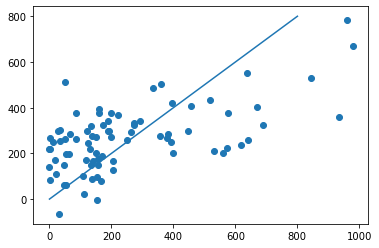

In [31]:
plt.scatter(y_valid,y_pred_Lasso)
x = np.array(range(0,900,100))
plt.plot(x,x)

In [32]:
#클수록 r2 감소
ctrl_factor = 210

final_under2003["pred"] = reg_Lasso.predict(df_x)

final_under2003_ctrl = pd.DataFrame(final_under2003)
for idx, row in final_under2003_ctrl.iterrows():
    if abs(row['EFF'] - row['pred']) > ctrl_factor:
        final_under2003_ctrl = final_under2003_ctrl.drop(idx, axis=0)
        
final_under2003_ctrl

,선수명,대학교,경기수,전체 출전시간,득점 전체,득점 평균,2점슛 성공,2점슛 시도,2점슛 성공률,3점슛 성공,...,속공,FBF,턴오버,팀 리바운드,팀 턴오버,년수,대회년도,키,EFF,pred
0,강병진,건국대학교,3.6,421.785000,10.3,2.2,3.2,8.2,4.030,1.2,...,0.0,0.0,4.0,0.0,0.0,3.0,2009.0,193.0,81.0,283.660617
3,강호연,명지대학교,16.6,2634.055000,107.6,13.8,13.9,33.6,7.957,25.3,...,4.2,1.7,16.3,11.4,3.7,4.0,2013.5,188.0,102.0,137.122009
4,곽동기,상명대학교,19.2,4611.265000,227.8,19.5,90.9,168.1,8.164,4.0,...,2.3,0.7,47.5,17.7,4.7,4.0,2017.5,193.0,185.0,67.801278
5,곽정훈,상명대학교,13.8,4011.751667,215.5,34.2,52.8,96.2,11.626,27.6,...,18.7,10.1,22.8,4.4,0.7,4.0,2018.5,187.0,53.0,195.410864
6,권성진,경희대학교,20.1,4257.543333,155.5,14.8,28.2,65.2,8.245,29.5,...,9.5,5.1,26.3,17.4,0.7,4.0,2016.5,180.0,125.0,246.862646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262,허진성,건국대학교,5.3,1819.161667,43.2,7.4,11.5,27.0,4.582,4.8,...,0.0,0.0,9.3,0.0,0.0,4.0,2006.5,182.0,149.0,316.936100
263,허효진,중앙대학교,6.1,1244.990000,62.8,9.9,18.3,33.0,5.559,6.5,...,0.0,0.0,6.5,0.0,0.0,4.0,2004.5,190.0,311.0,316.492372
264,홍경기,고려대학교,4.0,1365.050000,51.0,12.0,8.0,14.0,5.710,10.0,...,0.0,0.0,10.0,0.0,0.0,1.0,2010.0,184.0,362.0,319.512105
266,홍성헌,성균관대학교,4.1,1235.015000,59.3,14.3,22.8,54.2,4.430,0.0,...,0.0,0.0,6.3,0.0,0.0,3.0,2005.0,195.0,-1.0,163.937656


In [33]:
df_x = final_under2003_ctrl.drop(['EFF','년수', '선수명','대학교','대회년도'],axis=1)
df_y = final_under2003_ctrl['EFF']

x_train, x_valid, y_train, y_valid = train_test_split(df_x, df_y, random_state = 80, test_size = 0.30)
reg_Lasso = Lasso(alpha = 6.9)
reg_Lasso.fit(x_train, y_train)
y_pred_Lasso = reg_Lasso.predict(x_valid)
r2Lasso = r2_score(y_valid,y_pred_Lasso)
print(r2Lasso) # r-squred 값

0.44935330739337254


In [34]:
reg_Lasso.coef_

array([-0.03624402, -0.00963281,  0.10483115,  0.        , -0.        ,
       -1.32218952,  0.        ,  1.45938847, -0.1042986 ,  4.28603239,
       -0.49190016,  3.22587693, -1.77585067,  3.15568335, -0.14319021,
       -3.961487  ,  1.03055405, -0.        , -0.85554099, -0.13835124,
        0.        ,  1.25302525, -1.53524359,  0.442301  ,  0.        ,
       -0.        , -0.        , -0.        , -3.38369542,  0.        ,
       -2.14254343,  0.        ,  0.        ,  0.70716305])

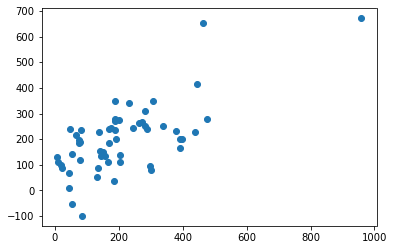

In [35]:
plt.scatter(y_valid,y_pred_Lasso)

In [36]:
N = len(y_valid)
p = len(coef)
r2_adj = 1-((1-r2Lasso)*(N-1)/(N-p-1))
print(r2_adj)

-0.12168770716164845
